Notebook dedicado ao treinamento e teste do modelo XGBoost aplicado aos 22 criptoativos escolhidos.

# 1. Bibliotecas e Constantes

In [118]:
import pandas as pd
import numpy as np
import seaborn as sns
import yfinance as yf
import datetime as dt
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings(action='ignore')
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=DeprecationWarning)

from sklearnex import patch_sklearn
patch_sklearn()

from sklearn.experimental import enable_halving_search_cv # noqa
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, HalvingGridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler 
from sklearn.pipeline import Pipeline

import plotly as py
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import xgboost as xgb
from xgboost import plot_importance

from boruta import BorutaPy
from joblib import dump, load

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [119]:
horizonte = 10 #horizonte da previsão, em dias.

# 2. Preparação de dados

In [120]:
df_ativos = pd.read_csv(r"C:\Users\Alexandre\OneDrive\Documentos\1. PRO\Data Science\Projeto Integrador\Dados\df_ativos\df_ativos_raw.csv", index_col=0)
df_ativos.sort_index(inplace=True) #Organizando o df por datas
df_ativos.drop(columns = 'Adj Close', inplace=True)
df_ativos

,Ativo,Open,High,Low,Close,Volume
2014-09-17,BTC-USD,465.864014,468.174011,452.421997,457.334015,21056800
2014-09-17,DOGE-USD,0.000293,0.000299,0.000260,0.000268,1463600
2014-09-17,XMR-USD,1.841200,1.898070,1.647920,1.768350,291633
2014-09-17,LTC-USD,5.085890,5.170770,4.965950,5.058550,3071840
2014-09-17,DASH-USD,3.327650,3.878730,3.297880,3.753940,574556
...,...,...,...,...,...,...
2021-08-20,XLM-USD,0.366957,0.387311,0.360759,0.385290,780181594
2021-08-20,BNB-USD,430.975037,457.603729,422.080170,454.936310,2451578694
2021-08-20,LINK-USD,27.060467,28.979713,26.707174,28.701841,1751490161
2021-08-20,MKR-USD,3745.071533,3850.748535,3705.013672,3813.081787,145465521


Vamos fazer um pequeno check de consistência nos dados:

In [121]:
df_ativos.isna().sum()

Ativo     0
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64

Nenhum dado nulo no dataframe.

In [122]:
df_ativos.groupby(['Ativo']).count()

,Open,High,Low,Close,Volume
Ativo,,,,,
ADA-USD,1415,1415,1415,1415,1415
BCH-USD,1486,1486,1486,1486,1486
BNB-USD,1484,1484,1484,1484,1484
BTC-USD,2526,2526,2526,2526,2526
DASH-USD,2526,2526,2526,2526,2526
DOGE-USD,2526,2526,2526,2526,2526
EOS-USD,1508,1508,1508,1508,1508
ETC-USD,1850,1850,1850,1850,1850
ETH-USD,2202,2202,2202,2202,2202


Nem todos os ativos apresentam cotação para todo o período. Porém há dados que cobrem razoável parte do espectro temporal para cada ativo. Não obstante, alguns ativos mais recentes, como o ICP1, não poderão ser analisados pelo curto prazo de dados.

Vamos criar uma lista com o nome dos ativos, para facilitar as iterações futuras:

In [123]:
ativos = list(df_ativos['Ativo'].unique())
ativos

['BTC-USD',
 'DOGE-USD',
 'XMR-USD',
 'LTC-USD',
 'DASH-USD',
 'XLM-USD',
 'XRP-USD',
 'USDT-USD',
 'ETH-USD',
 'ETC-USD',
 'NEO-USD',
 'MKR-USD',
 'MIOTA-USD',
 'EOS-USD',
 'BCH-USD',
 'BNB-USD',
 'TRX-USD',
 'LINK-USD',
 'ADA-USD',
 'XTZ-USD',
 'FIL-USD',
 'THETA-USD']

## Nos inspiramos em um paper ([Link](https://sci-hub.se/10.1016/j.asoc.2020.106943 "Artigo")) que traz uma série de dados de entrada, que vamos preparar na sequência. São eles:

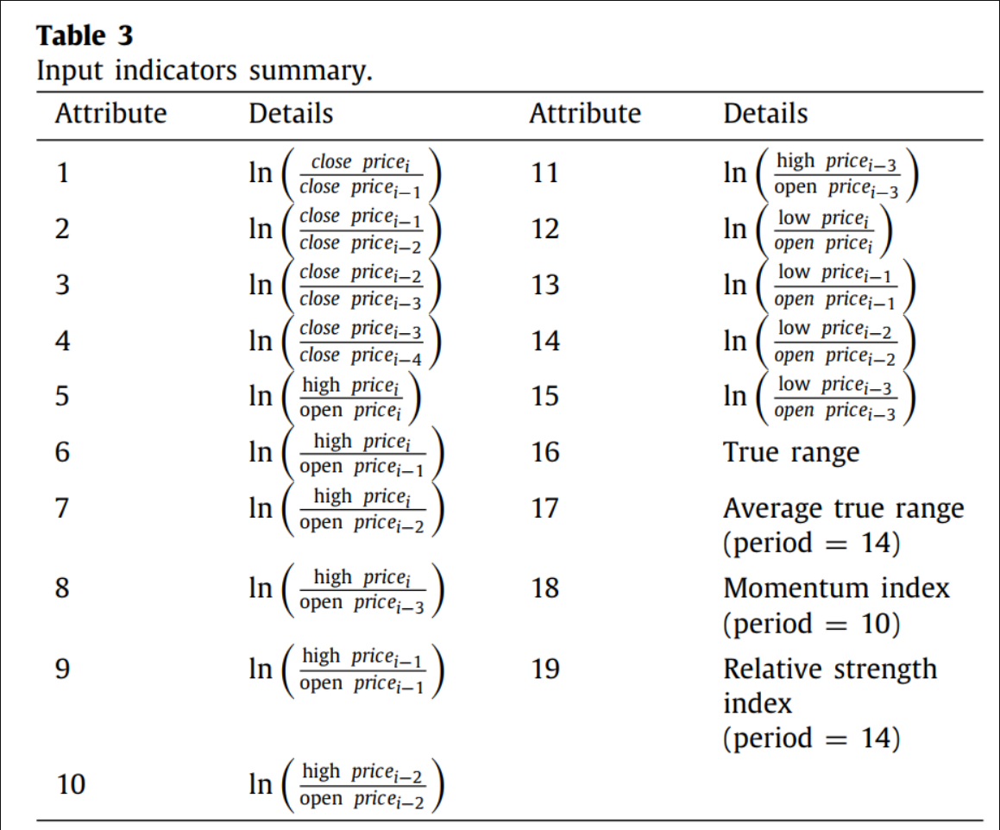

Como se pode observar, são 15 variáveis que envolvem relações temporais entre preços (open, high, low, close), além de 4 outras features muito utilizadas (True Range, Average True Range | 14d, Momentum Index | 10d, Relative Strength Index | 14d).

Na sequência, vamos criar todas essas varíaveis com base nos dados já levantados. Siglas:

* O - Open Price para um dia *"i"* específico
* H - Highest Price para um dia *"i"* específico
* L - Lowest Price para um dia *"i"* específico
* C - Close Price para um dia *"i"* específico

In [124]:
#Função para calcular RSI: [Créditos para https://www.kaggle.com/mtszkw/xgboost-for-stock-trend-prices-prediction, levemente modificado para comportar diversos ativos]

def relative_strength_idx(df, ativo, n=14):
    close = df[df['Ativo']==ativo]['Close']
    delta = close.diff()
    pricesUp = delta.copy()
    pricesDown = delta.copy()
    pricesUp[pricesUp < 0] = 0
    pricesDown[pricesDown > 0] = 0
    rollUp = pricesUp.rolling(n).mean()
    rollDown = pricesDown.abs().rolling(n).mean()
    rs = rollUp / rollDown
    rsi = 100 - (100 / (1 + rs))
    return rsi

In [125]:
df_ativos['1: ln(C/C-1)'] = pd.Series(dtype=float)
df_ativos['2: ln(C-1/C-2)'] = pd.Series(dtype=float)
df_ativos['3: ln(C-2/C-3)'] = pd.Series(dtype=float)
df_ativos['4: ln(C-3/C-4)'] = pd.Series(dtype=float)
df_ativos['5: ln(H/O)'] = pd.Series(dtype=float)
df_ativos['6: ln(H/O-1)'] = pd.Series(dtype=float)
df_ativos['7: ln(H/O-2)'] = pd.Series(dtype=float)
df_ativos['8: ln(H/O-3)'] = pd.Series(dtype=float)
df_ativos['9: ln(H-1/O-1)'] = pd.Series(dtype=float)
df_ativos['10: ln(H-2/O-2)'] = pd.Series(dtype=float)
df_ativos['11: ln(H-3/O-3)'] = pd.Series(dtype=float)
df_ativos['12: ln(L/O)'] = pd.Series(dtype=float)
df_ativos['13: ln(L-1/O-1)'] = pd.Series(dtype=float)
df_ativos['14: ln(L-2/O-2)'] = pd.Series(dtype=float)
df_ativos['15: ln(L-3/O-3)'] = pd.Series(dtype=float)
df_ativos['16: True Range'] = pd.Series(dtype=float)
df_ativos['17: ATR 14d'] = pd.Series(dtype=float)
df_ativos['18: MI 10d'] = pd.Series(dtype=float)
df_ativos['19: RSI 14d'] = pd.Series(dtype=float)

for ativo in ativos:
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'1: ln(C/C-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'] / df_ativos.loc[df_ativos['Ativo'] == ativo,'Close'].shift(1))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'2: ln(C-1/C-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(1)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(2))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'3: ln(C-2/C-3)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(2)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(3))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'4: ln(C-3/C-4)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(3)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(4))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'5: ln(H/O)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'])
    df_ativos.loc[df_ativos['Ativo'] == ativo,'6: ln(H/O-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(1))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'7: ln(H/O-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(2))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'8: ln(H/O-3)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(3))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'9: ln(H-1/O-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High'].shift(1)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(1))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'10: ln(H-2/O-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High'].shift(2)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(2))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'11: ln(H-3/O-3)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High'].shift(3)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(3))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'12: ln(L/O)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Low']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'])
    df_ativos.loc[df_ativos['Ativo'] == ativo,'13: ln(L-1/O-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Low'].shift(1)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(1))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'14: ln(L-2/O-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Low'].shift(2)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(2))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'15: ln(L-3/O-3)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Low'].shift(3)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(3))
    
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'16: True Range'] = np.nanmax([np.abs(df_ativos.loc[df_ativos['Ativo'] == ativo, 'High'] - df_ativos.loc[df_ativos['Ativo'] == ativo, 'Low']), 
                                                                            np.abs(df_ativos.loc[df_ativos['Ativo'] == ativo, 'High'] - df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'].shift(1)), 
                                                                            np.abs(df_ativos.loc[df_ativos['Ativo'] == ativo, 'Low'] - df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'].shift(1))], axis=0)
    
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'17: ATR 14d'] = df_ativos.loc[df_ativos['Ativo'] == ativo,'16: True Range'].rolling(window=14).mean()
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'18: MI 10d'] = df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'] - df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'].shift(10)

    df_ativos.loc[df_ativos['Ativo'] == ativo,'19: RSI 14d'] = relative_strength_idx(df_ativos,ativo)
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'20: ln(Vol/Vol-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo, 'Volume'] / df_ativos.loc[df_ativos['Ativo'] == ativo,'Volume'].shift(1))
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'21: ln(Vol-1/Vol-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo, 'Volume'].shift(1) / df_ativos.loc[df_ativos['Ativo'] == ativo,'Volume'].shift(2))

    #Como a ideia é prever o preço do dia seguinte, vamos dar um shift na coluna 'Close' para o horizonte requerido:
    df_ativos.loc[df_ativos['Ativo'] == ativo,'Close'] = df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'].shift(-horizonte)
    
df_ativos.dropna(inplace=True)
df_ativos.drop(columns = ['Open', 'High', 'Low'], inplace=True) #Dropando colunas inúteis, incluindo a feature 17 que puxa demais a resposta, gerando overfitting.

df_ativos

,Ativo,Close,Volume,1: ln(C/C-1),2: ln(C-1/C-2),3: ln(C-2/C-3),4: ln(C-3/C-4),5: ln(H/O),6: ln(H/O-1),7: ln(H/O-2),...,12: ln(L/O),13: ln(L-1/O-1),14: ln(L-2/O-2),15: ln(L-3/O-3),16: True Range,17: ATR 14d,18: MI 10d,19: RSI 14d,20: ln(Vol/Vol-1),21: ln(Vol-1/Vol-2)
2014-10-01,XMR-USD,1.076710,65140,-0.016527,0.059606,-0.059705,-0.068457,0.008003,0.045624,-0.002255,...,-0.031240,-0.018786,-0.066445,-0.077904,0.048250,0.170490,-0.074570,26.377827,-0.231326,-0.021785
2014-10-01,BTC-USD,362.299011,26229400,-0.008641,0.030109,-0.004555,-0.057539,0.010149,0.039853,0.037622,...,-0.017306,-0.007058,-0.012515,-0.064998,10.598999,22.595568,-15.206024,31.461697,-0.280069,0.065781
2014-10-01,LTC-USD,3.772660,1172180,-0.010372,0.052283,0.003198,-0.043582,0.007305,0.057474,0.060904,...,-0.019445,-0.006195,-0.009372,-0.051438,0.118880,0.276422,0.182640,35.151758,-0.739840,0.360663
2014-10-01,XRP-USD,0.004753,64998,0.022989,-0.013050,-0.115679,0.115679,0.026974,0.014140,-0.100971,...,-0.000215,-0.014990,-0.125150,-0.011971,0.000128,0.000272,0.000182,37.495167,-0.520216,-0.110047
2014-10-01,XLM-USD,0.002336,70180,-0.108792,-0.000311,0.011901,-0.027654,0.019066,0.017205,0.035026,...,-0.140787,-0.030200,-0.030752,-0.049327,0.000485,0.000551,-0.000584,47.186400,1.200322,-0.441454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-10,THETA-USD,7.277748,313640625,0.022782,0.055899,-0.078676,0.008999,0.046528,0.101348,0.022183,...,-0.022217,-0.045526,-0.100783,-0.023618,0.471332,0.546775,0.829253,63.521194,-0.092111,0.027526
2021-08-10,FIL-USD,73.149849,621114680,-0.015608,0.049901,-0.071522,0.076856,0.028505,0.076606,0.005017,...,-0.037752,-0.046644,-0.085427,-0.005828,4.461952,4.128175,14.518639,78.580838,-0.160927,0.059444
2021-08-10,XLM-USD,0.385290,685222152,0.035555,0.040420,-0.063779,0.072823,0.050259,0.090640,0.023069,...,-0.011454,-0.024472,-0.072161,-0.009732,0.018816,0.019635,0.024320,71.750600,0.097456,0.031211
2021-08-10,XMR-USD,281.944458,228553925,-0.014969,0.050606,-0.053536,0.029749,0.003860,0.051646,-0.002090,...,-0.034721,-0.013014,-0.057096,-0.012813,10.247986,15.807799,26.001953,67.960800,0.001610,0.004350


<AxesSubplot:>

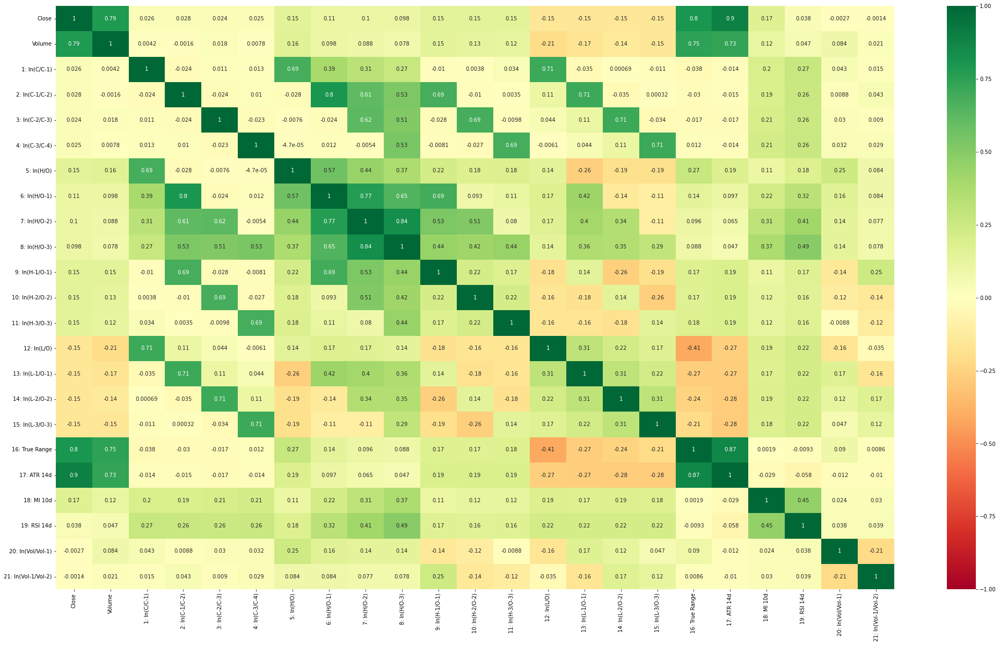

In [126]:
fig,ax = plt.subplots(figsize = (35,20))
sns.heatmap(df_ativos[df_ativos.Ativo == 'BTC-USD'].corr(),vmin=-1,vmax=1,annot=True,cmap="RdYlGn")

Percebemos que a variável '17: ATR 14d' é muito correlacionada com a '16: True Range'. Portanto, vamos dropar a primeira, o que resultou em melhores resultados nos testes feitos

In [127]:
#df_ativos.drop(columns = '17: ATR 14d', inplace=True)

In [128]:
df_ativos.to_csv(r"C:\Users\Alexandre\OneDrive\Documentos\1. PRO\Data Science\Projeto Integrador\Dados\df_ativos\df_ativos_processed.csv", index = True)

In [129]:
df_ativos[df_ativos.Ativo == 'BTC-USD']

,Ativo,Close,Volume,1: ln(C/C-1),2: ln(C-1/C-2),3: ln(C-2/C-3),4: ln(C-3/C-4),5: ln(H/O),6: ln(H/O-1),7: ln(H/O-2),...,12: ln(L/O),13: ln(L-1/O-1),14: ln(L-2/O-2),15: ln(L-3/O-3),16: True Range,17: ATR 14d,18: MI 10d,19: RSI 14d,20: ln(Vol/Vol-1),21: ln(Vol-1/Vol-2)
2014-10-01,BTC-USD,362.299011,26229400,-0.008641,0.030109,-0.004555,-0.057539,0.010149,0.039853,0.037622,...,-0.017306,-0.007058,-0.012515,-0.064998,10.598999,22.595568,-15.206024,31.461697,-0.280069,0.065781
2014-10-02,BTC-USD,378.549011,21777700,-0.022521,-0.008641,0.030109,-0.004555,0.003922,-0.004994,0.024710,...,-0.029178,-0.017306,-0.007058,-0.012515,12.550995,20.332781,-27.080017,35.852649,-0.185994,-0.280069
2014-10-03,BTC-USD,390.414001,30901200,-0.042370,-0.022521,-0.008641,0.030109,0.006678,-0.016524,-0.025440,...,-0.047269,-0.029178,-0.017306,-0.007058,19.835999,18.656568,-76.278992,39.000831,0.349909,-0.185994
2014-10-04,BTC-USD,400.869995,47236500,-0.089097,-0.042370,-0.022521,-0.008641,0.012687,-0.028918,-0.052120,...,-0.099256,-0.047269,-0.029178,-0.017306,38.601013,19.027141,-94.338989,27.381697,0.424372,0.349909
2014-10-05,BTC-USD,394.773010,83308096,-0.025737,-0.089097,-0.042370,-0.022521,0.038426,-0.051575,-0.093180,...,-0.128352,-0.099256,-0.047269,-0.029178,52.505005,21.402856,-91.063995,27.651597,0.567379,0.424372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-06,BTC-USD,46004.484375,38226483046,0.046538,0.027838,0.040943,-0.027122,0.057203,0.085026,0.124313,...,-0.023113,-0.059251,-0.016469,-0.036291,3339.480469,2507.988839,3409.558594,76.537085,0.082908,0.326952
2021-08-07,BTC-USD,44695.359375,40030862141,0.039819,0.046538,0.027838,0.040943,0.042443,0.089451,0.117275,...,-0.005014,-0.023113,-0.059251,-0.016469,2071.292969,2579.828962,4559.894531,77.846439,0.046122,0.082908
2021-08-08,BTC-USD,44801.187500,36302664750,-0.017152,0.039819,0.046538,0.027838,0.015757,0.055613,0.102622,...,-0.028271,-0.005014,-0.023113,-0.059251,1950.441406,2613.211217,3789.695312,73.300225,-0.097760,0.046122
2021-08-09,BTC-USD,46717.578125,38734079049,0.056963,-0.017152,0.039819,0.046538,0.059074,0.041363,0.081219,...,-0.021774,-0.028271,-0.005014,-0.023113,3608.144531,2498.624163,4129.855469,74.127886,0.064829,-0.097760


# 2b. Split entre treino e teste

In [130]:
test_size = 0.1

test_split_idx  = int(df_ativos[df_ativos['Ativo']=='BTC-USD'].shape[0] * (1-test_size))

df_train  = df_ativos[df_ativos['Ativo']=='BTC-USD'].iloc[:test_split_idx].copy()
df_test   = df_ativos[df_ativos['Ativo']=='BTC-USD'].iloc[test_split_idx+1:].copy()

X_train = df_train.drop(columns=['Close','Ativo']) #df_train[lista_boruta]
X_test = df_test.drop(columns=['Close','Ativo']) #df_test[lista_boruta]

y_train = df_train['Close']
y_test = df_test['Close']



# 3. Função para treinamento, validação, tunning, teste e armazenamento dos modelos para cada ativo

In [131]:
def model_crypto(ativo, df_ativos):

    #1. Split treino+validação / teste:
    
    
    test_size = 0.05
    test_split_idx  = int(df_ativos[df_ativos['Ativo']==ativo].shape[0] * (1-test_size))

    df_train  = df_ativos[df_ativos['Ativo']==ativo].iloc[:test_split_idx].copy()
    df_test   = df_ativos[df_ativos['Ativo']==ativo].iloc[test_split_idx+1:].copy()

    X_train = df_train.drop(columns=['Close','Ativo']) #df_train[lista_boruta]
    X_test = df_test.drop(columns=['Close','Ativo']) #df_test[lista_boruta]

    y_train = df_train['Close']
    y_test = df_test['Close']
    
    
    #2. Modelo e tunning com validação baseada em TimeSeriesSplit: 
    model = xgb.XGBRegressor()
    print (f"\nIniciando tunning do modelo para {ativo}")
    param_search = {
    'learning_rate': [0.01, 0.1, 0.5, 1], #ok
    'n_estimators': [100, 250, 400], #ok 
    'max_depth': [2, 3, 5], #ok
    'subsample': [0.5, 0.7, 0.9], #ok
    #'model__colsample_bytree': [0.5, 0.7, 0.9], #ok 
    #'model__colsample_bylevel': [0.5, 0.7, 0.9], #ok
    'min_child_weight': [1, 3, 5, 7], #ok
    'reg_alpha': [0, 1e-5, 1e-3], #ok 
    'reg_lambda': [1e-5, 1e-2, 5e-2], #ok
    'random_state': [248]
}

    tscv = TimeSeriesSplit(n_splits=4)

    halving_cv = HalvingGridSearchCV(model, param_search, scoring='neg_mean_squared_error', n_jobs=-1, min_resources="exhaust", factor=3, cv = tscv, verbose = 4)

    halving_cv.fit(X_train, y_train)
    
    model_best = halving_cv.best_estimator_
    
    print (f"\nMelhor modelo escolhido com os parâmetros:")
    halving_cv.best_params_
    
    #3. Predição, gráficos e feature importance:
    
    y_pred = model_best.predict(X_test)
    y_total = model_best.predict(df_ativos[df_ativos['Ativo']==ativo].drop(columns = ['Ativo','Close']))
    
    fig = go.Figure(layout=go.Layout(title=go.layout.Title(text=ativo))) 
    fig.add_trace(go.Scatter(x=X_train.index, y=y_train, name='Treino'))
    fig.add_trace(go.Scatter(x=X_test.index,  y=y_test,  name='Teste'))
    fig.add_trace(go.Scatter(x=df_ativos[df_ativos['Ativo']==ativo].index,  y=y_total,  name='Pred'))
    fig.show()
    
    print (f"\nFeature importance para {ativo}:")
    plt.rcParams["figure.figsize"] = (20, 10)
    plot_importance(model_best)
    plt.show()
    
    #4. Métricas de erro no teste:
    
    MAPE_test = np.mean(np.abs((y_test - y_pred)/y_test))
    MSE_test = mean_squared_error(y_true = y_test, y_pred = y_pred, squared = False)
    MAE_test = mean_absolute_error(y_true = y_test, y_pred = y_pred)
    RMSE_test = mean_squared_error(y_true = y_test, y_pred = y_pred, squared = True)

    print(f"\nResultados do modelo no teste para {ativo}")
    print(f'MAPE = {MAPE_test:.4f}')
    print(f'MSE = {MSE_test:.4f}')
    print(f'MAE = {MAE_test:.4f}')
    print(f'RMSE = {RMSE_test:.4f}')
    
        
    #5. Salvando o modelo:
    
    nome_modelo = 'Modelo_' + str(ativo) + '.joblib'
    dump(model_best, nome_modelo)
    print (f"\n{nome_modelo} salvo com sucesso!")
    

# 4. Apresentação dos resultados para cada Ativo, com armazenamento dos modelos


Iniciando tunning do modelo para BTC-USD
n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 8
max_resources_: 2376
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits
----------
iter: 5
n_candidates: 16
n_resources: 1944
Fitting 4 folds for each of 16 candidates, totalling 64 fits

Melhor modelo escolhido com os parâmetros:


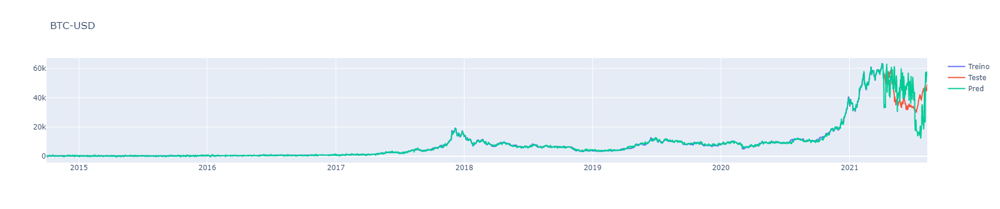


Feature importance para BTC-USD:


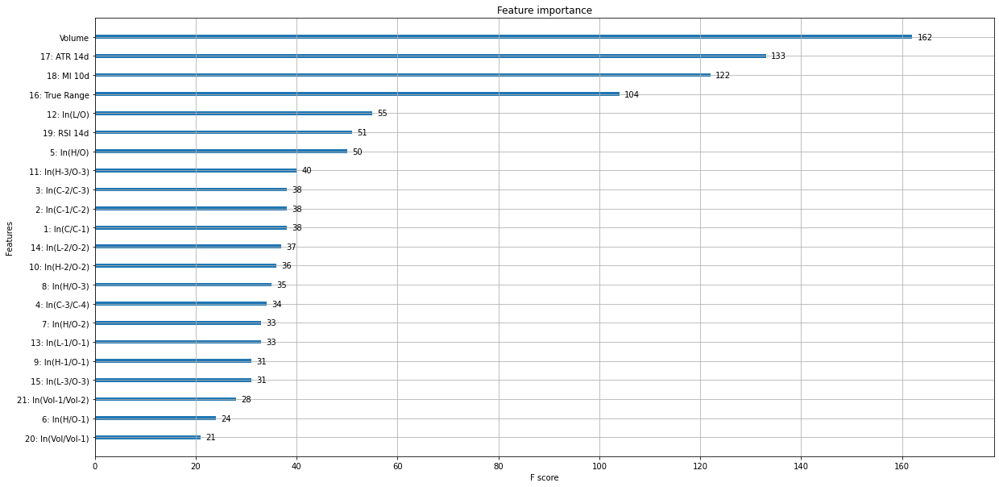


Resultados do modelo no teste para BTC-USD
MAPE = 0.3082
MSE = 14044.0759
MAE = 12009.5365
RMSE = 197236068.9843

Modelo_BTC-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para DOGE-USD
n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 8
max_resources_: 2376
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits
----------
iter: 5
n_candidates: 16
n_resources: 1944
Fitting 4 folds

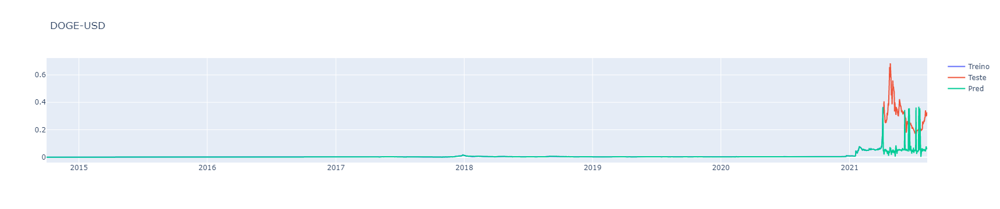


Feature importance para DOGE-USD:


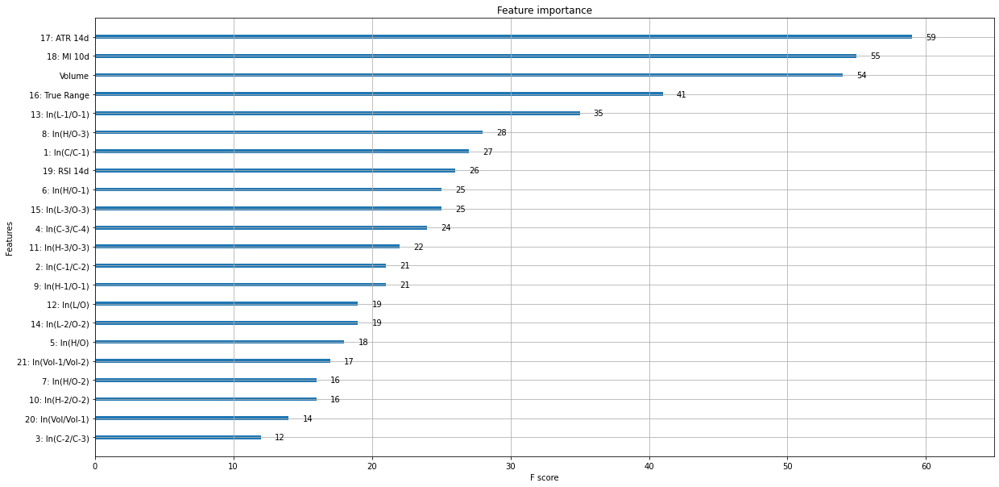


Resultados do modelo no teste para DOGE-USD
MAPE = 0.8113
MSE = 0.2783
MAE = 0.2543
RMSE = 0.0774

Modelo_DOGE-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para XMR-USD
n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 8
max_resources_: 2376
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits
----------
iter: 5
n_candidates: 16
n_resources: 1944
Fitting 4 folds for each of 16

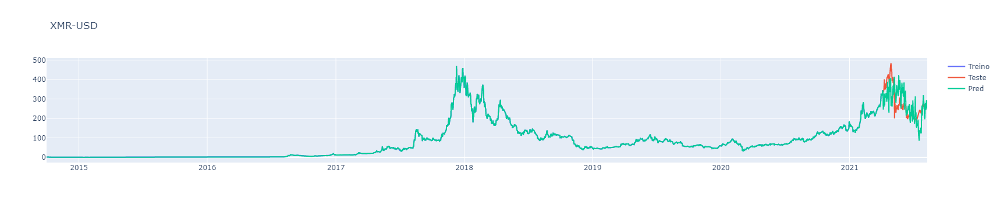


Feature importance para XMR-USD:


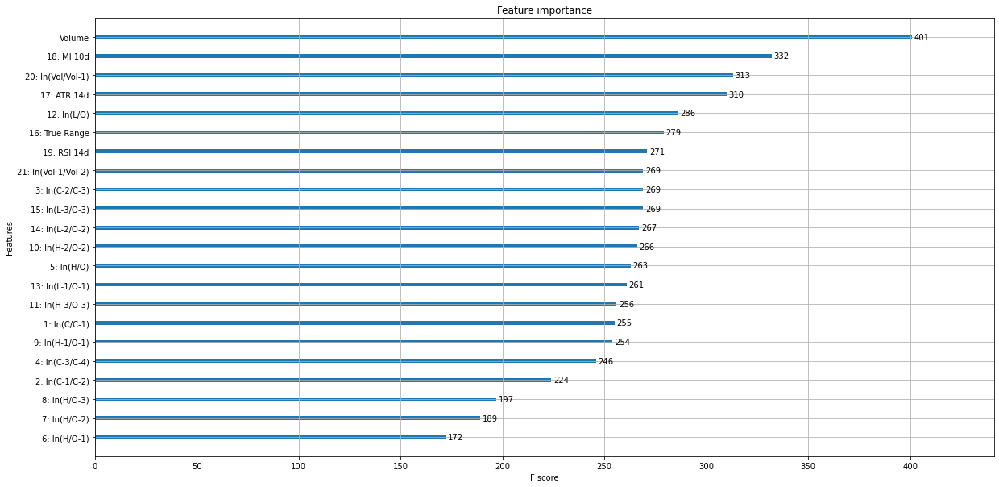


Resultados do modelo no teste para XMR-USD
MAPE = 0.2219
MSE = 75.7073
MAE = 61.6471
RMSE = 5731.5936

Modelo_XMR-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para LTC-USD
n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 8
max_resources_: 2376
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits
----------
iter: 5
n_candidates: 16
n_resources: 1944
Fitting 4 folds for each of

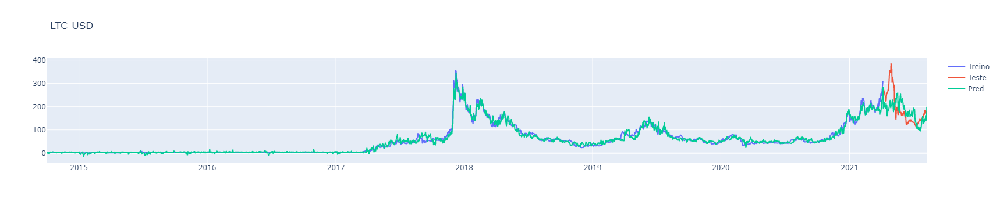


Feature importance para LTC-USD:


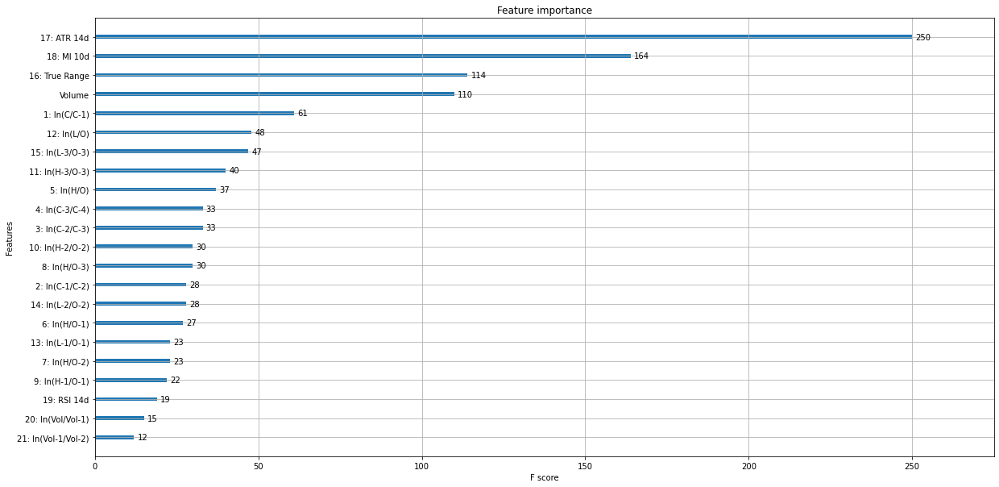


Resultados do modelo no teste para LTC-USD
MAPE = 0.2442
MSE = 60.2851
MAE = 48.3985
RMSE = 3634.2908

Modelo_LTC-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para DASH-USD
n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 8
max_resources_: 2376
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits
----------
iter: 5
n_candidates: 16
n_resources: 1944
Fitting 4 folds for each o

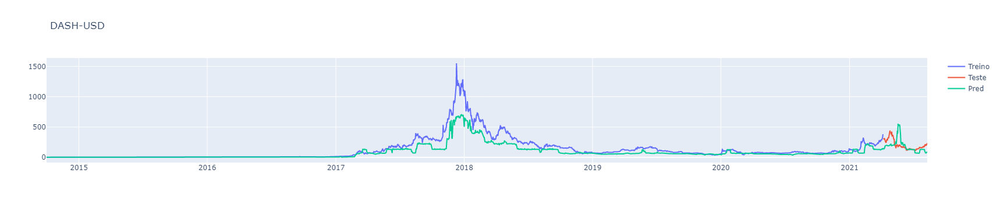


Feature importance para DASH-USD:


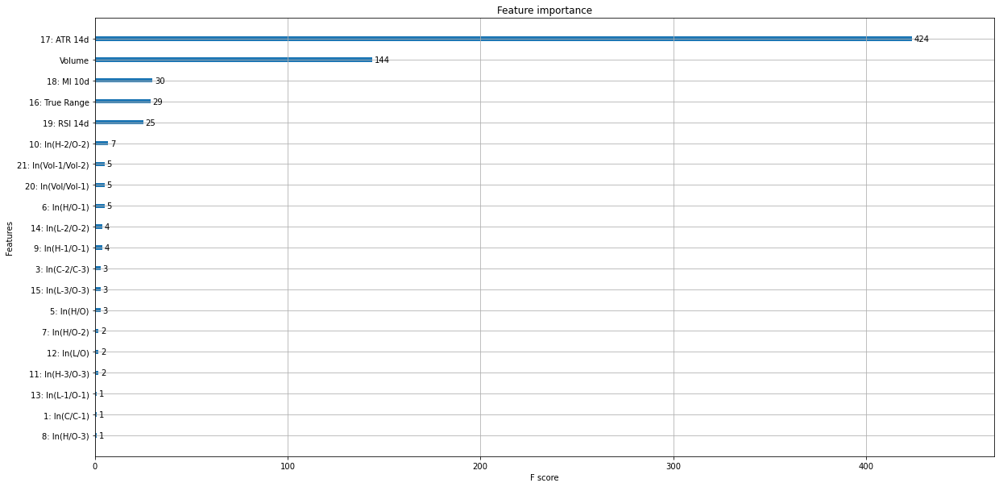


Resultados do modelo no teste para DASH-USD
MAPE = 0.4081
MSE = 123.8956
MAE = 89.2995
RMSE = 15350.1223

Modelo_DASH-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para XLM-USD
n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 8
max_resources_: 2376
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits
----------
iter: 5
n_candidates: 16
n_resources: 1944
Fitting 4 folds for eac

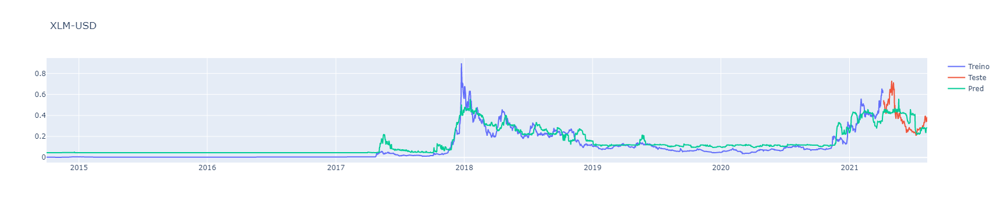


Feature importance para XLM-USD:


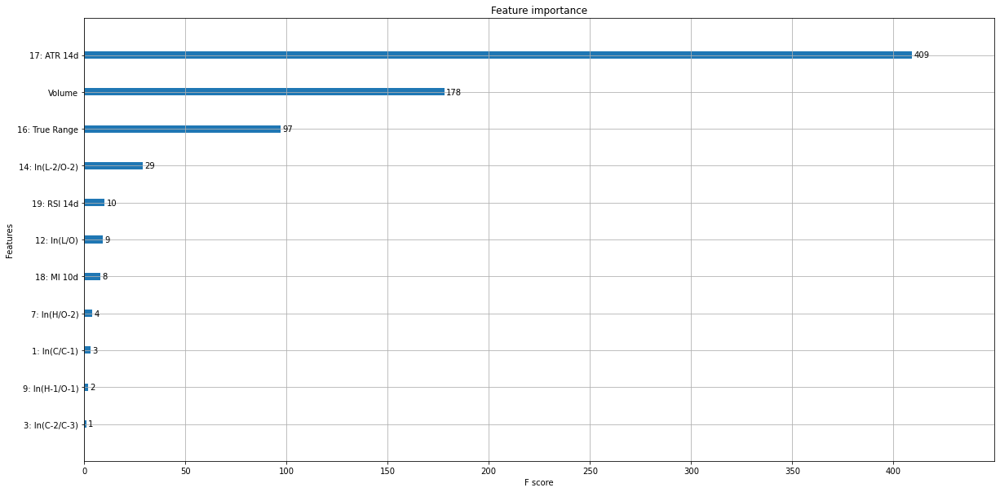


Resultados do modelo no teste para XLM-USD
MAPE = 0.2548
MSE = 0.1135
MAE = 0.0913
RMSE = 0.0129

Modelo_XLM-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para XRP-USD
n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 8
max_resources_: 2376
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits
----------
iter: 5
n_candidates: 16
n_resources: 1944
Fitting 4 folds for each of 16 c

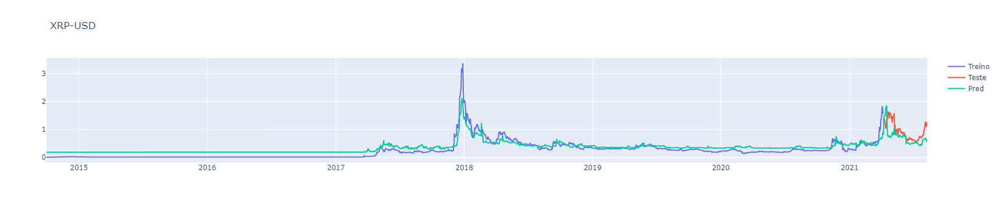


Feature importance para XRP-USD:


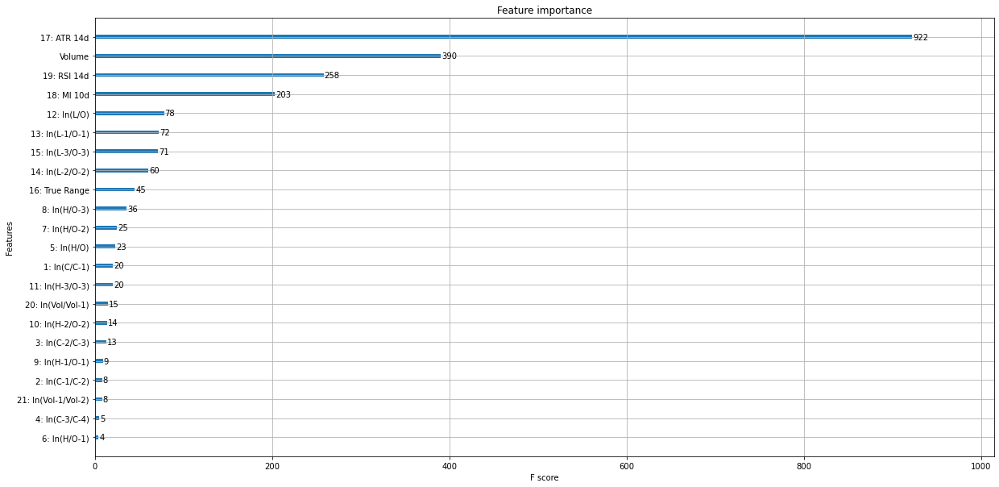


Resultados do modelo no teste para XRP-USD
MAPE = 0.2662
MSE = 0.3732
MAE = 0.2854
RMSE = 0.1393

Modelo_XRP-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para USDT-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1920
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


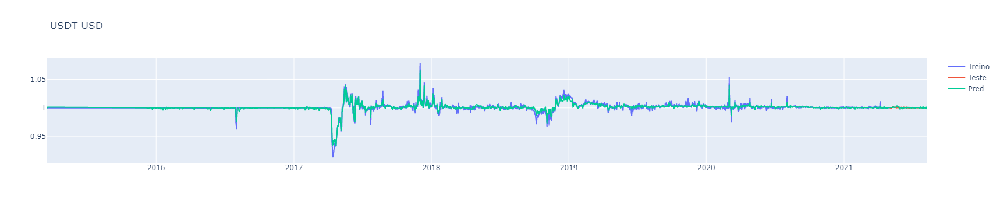


Feature importance para USDT-USD:


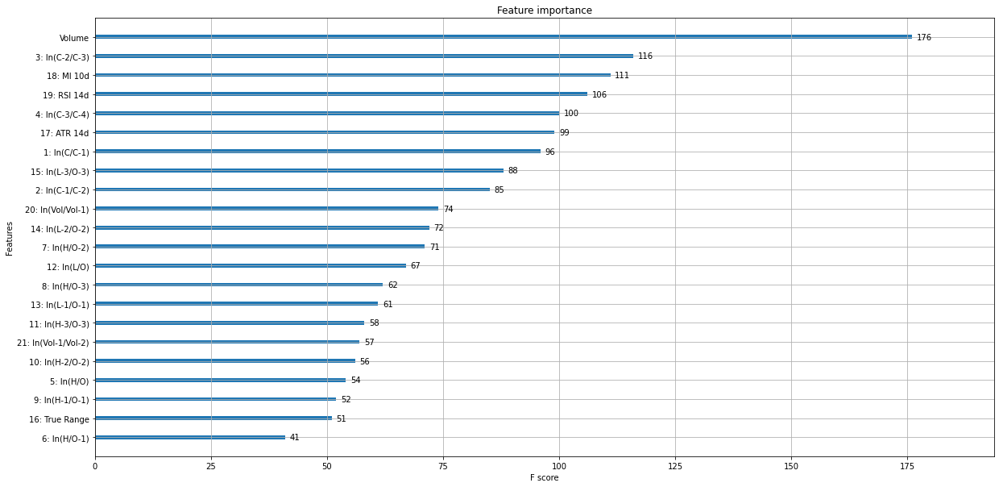


Resultados do modelo no teste para USDT-USD
MAPE = 0.0007
MSE = 0.0010
MAE = 0.0007
RMSE = 0.0000

Modelo_USDT-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para ETH-USD
n_iterations: 6
n_required_iterations: 8
n_possible_iterations: 6
min_resources_: 8
max_resources_: 2069
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits
----------
iter: 5
n_candidates: 16
n_resources: 1944
Fitting 4 folds for each of 16

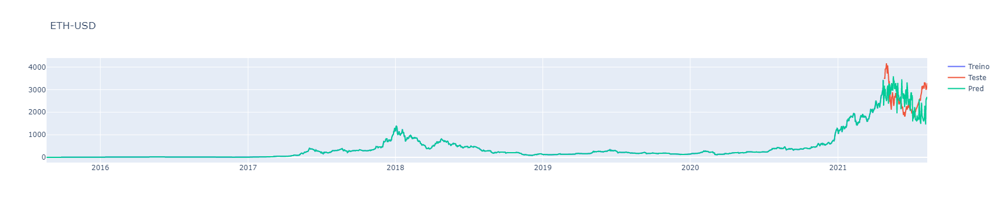


Feature importance para ETH-USD:


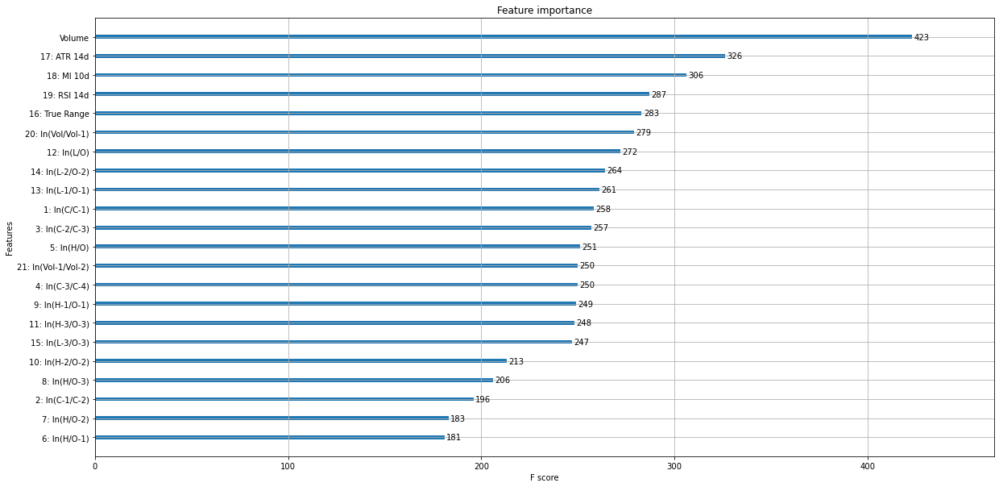


Resultados do modelo no teste para ETH-USD
MAPE = 0.2463
MSE = 777.9866
MAE = 648.1111
RMSE = 605263.0934

Modelo_ETH-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para ETC-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1734
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


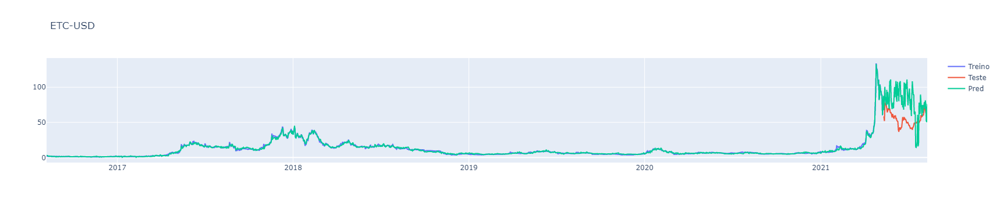


Feature importance para ETC-USD:


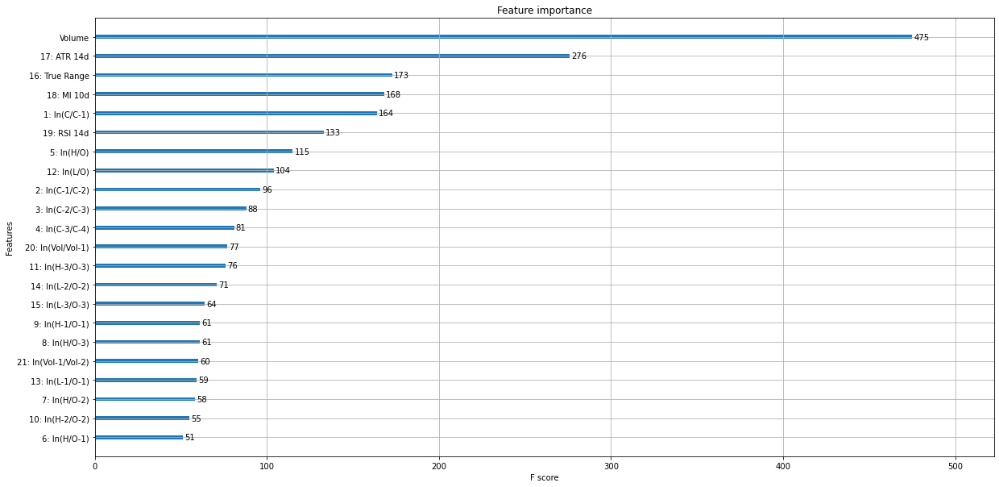


Resultados do modelo no teste para ETC-USD
MAPE = 0.5836
MSE = 34.1215
MAE = 29.0881
RMSE = 1164.2777

Modelo_ETC-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para NEO-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1690
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


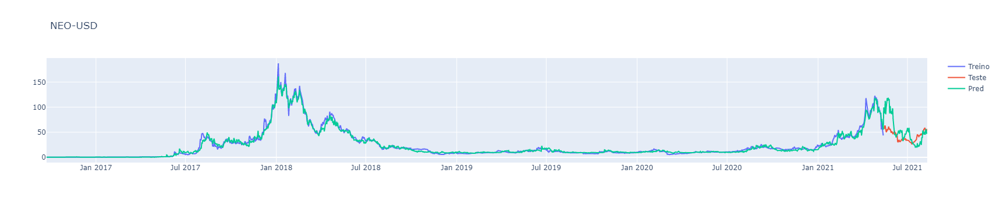


Feature importance para NEO-USD:


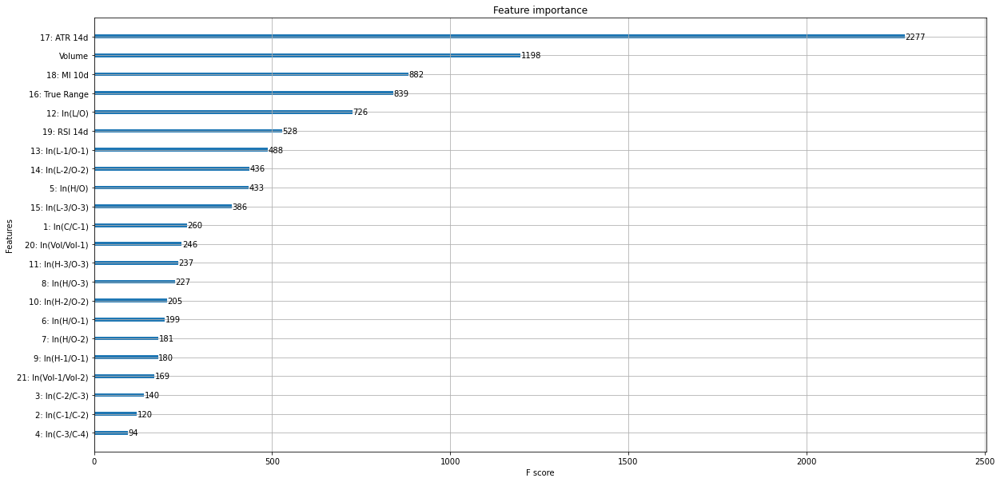


Resultados do modelo no teste para NEO-USD
MAPE = 0.4135
MSE = 24.6239
MAE = 18.4108
RMSE = 606.3361

Modelo_NEO-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para MKR-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1144
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


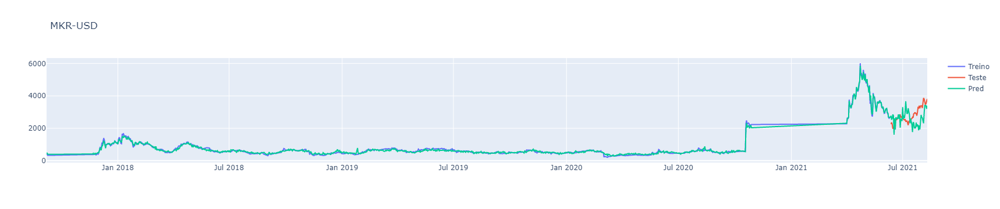


Feature importance para MKR-USD:


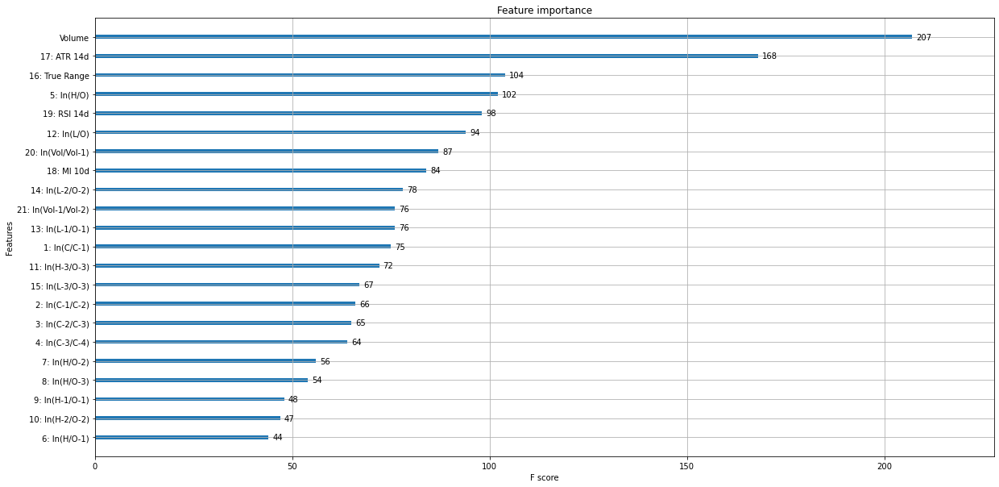


Resultados do modelo no teste para MKR-USD
MAPE = 0.1921
MSE = 671.5839
MAE = 541.3098
RMSE = 451024.8893

Modelo_MKR-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para MIOTA-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1426
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


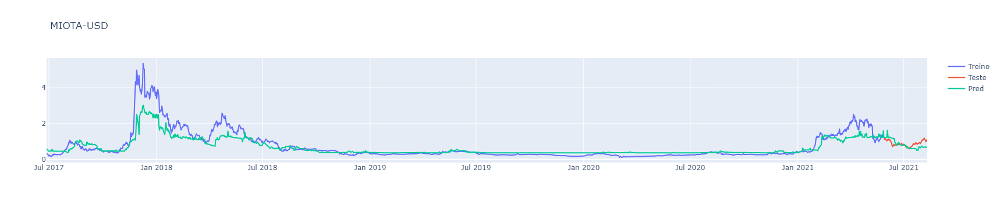


Feature importance para MIOTA-USD:


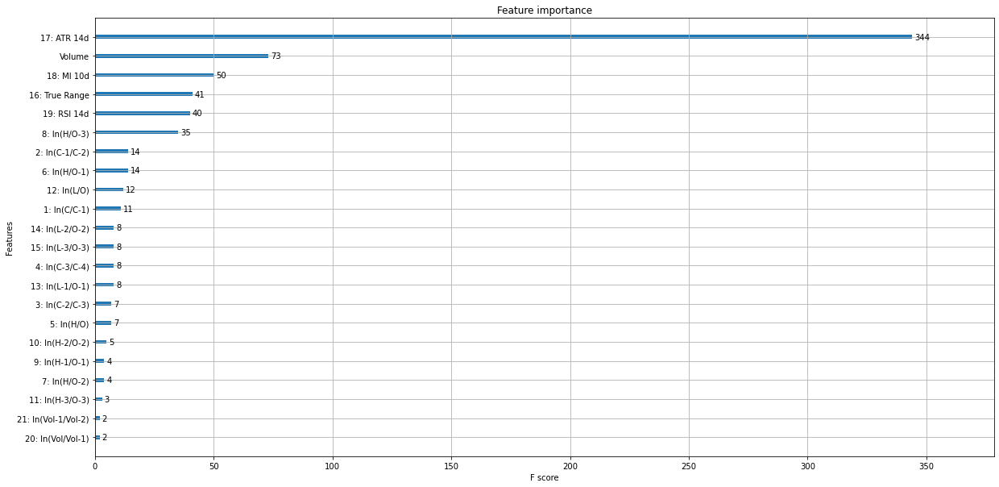


Resultados do modelo no teste para MIOTA-USD
MAPE = 0.2059
MSE = 0.2438
MAE = 0.1902
RMSE = 0.0594

Modelo_MIOTA-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para EOS-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1409
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


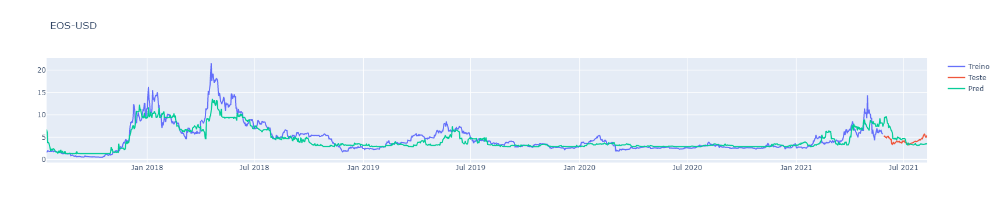


Feature importance para EOS-USD:


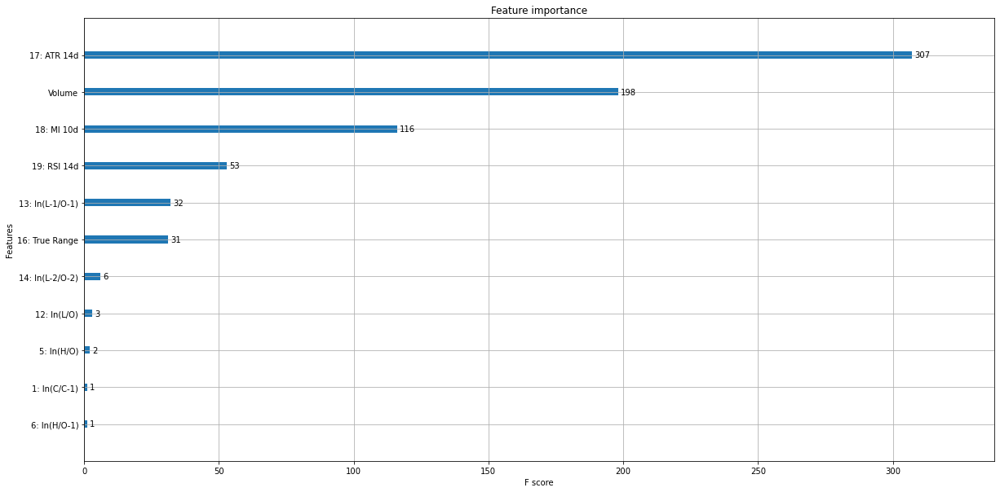


Resultados do modelo no teste para EOS-USD
MAPE = 0.2951
MSE = 1.7332
MAE = 1.3284
RMSE = 3.0041

Modelo_EOS-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para BCH-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1388
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


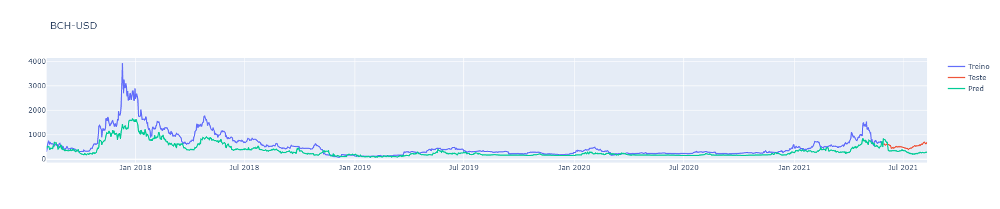


Feature importance para BCH-USD:


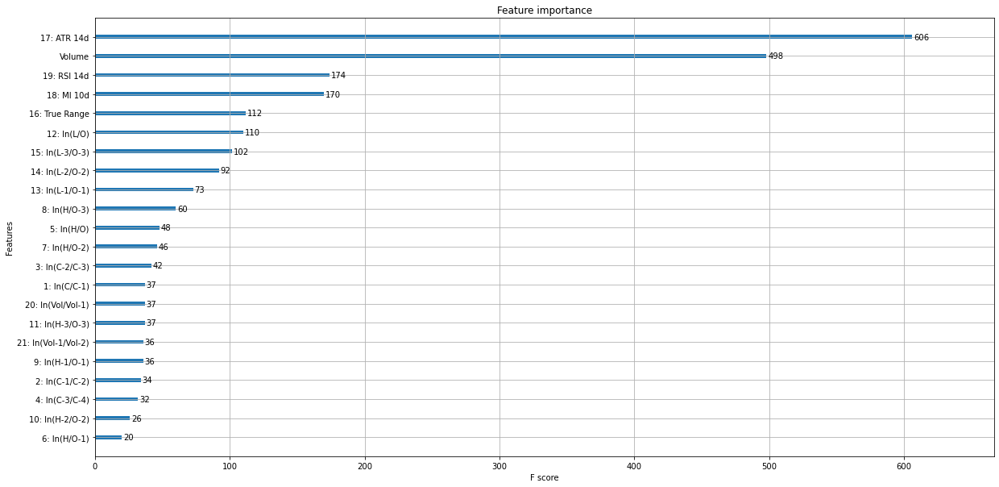


Resultados do modelo no teste para BCH-USD
MAPE = 0.4084
MSE = 243.4646
MAE = 222.4389
RMSE = 59275.0162

Modelo_BCH-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para BNB-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1387
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


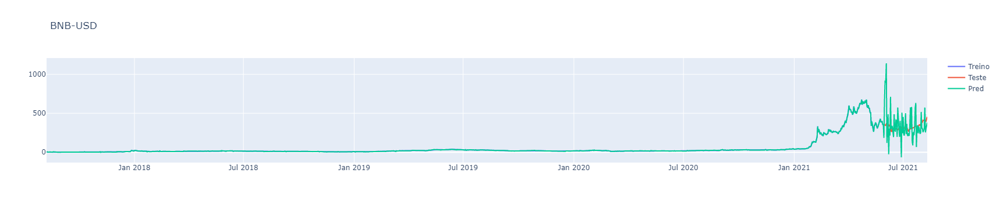


Feature importance para BNB-USD:


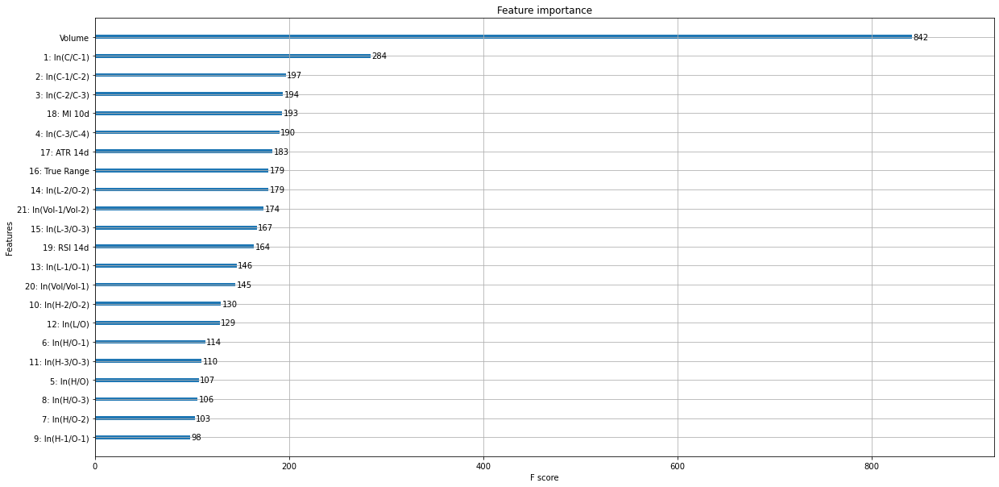


Resultados do modelo no teste para BNB-USD
MAPE = 0.4267
MSE = 199.5882
MAE = 142.1157
RMSE = 39835.4509

Modelo_BNB-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para TRX-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1339
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


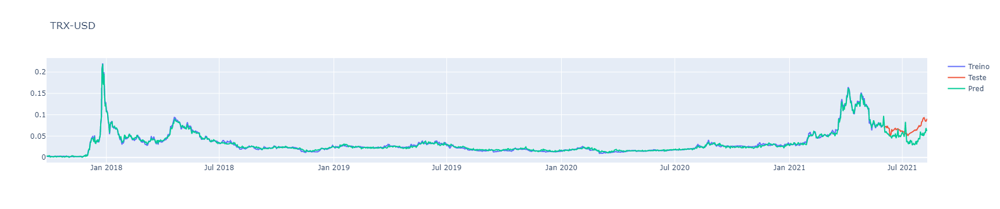


Feature importance para TRX-USD:


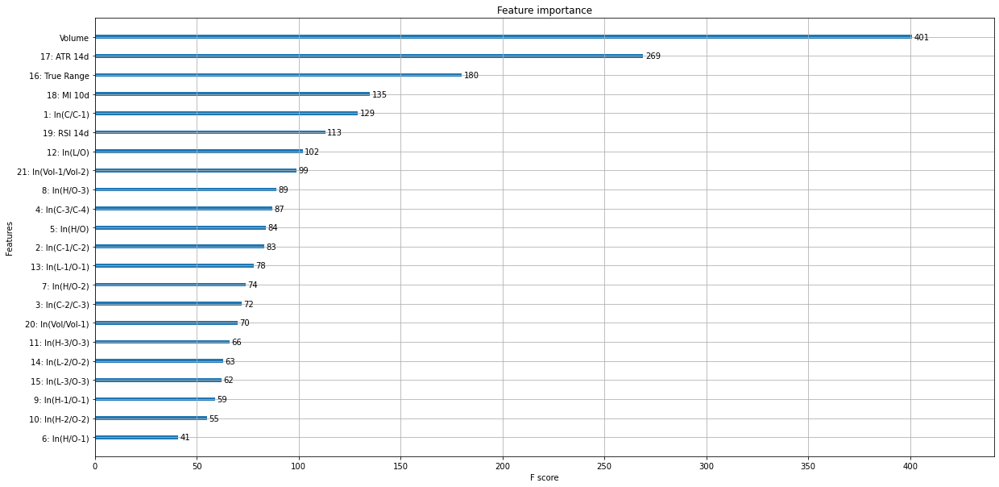


Resultados do modelo no teste para TRX-USD
MAPE = 0.2785
MSE = 0.0214
MAE = 0.0189
RMSE = 0.0005

Modelo_TRX-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para LINK-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1331
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


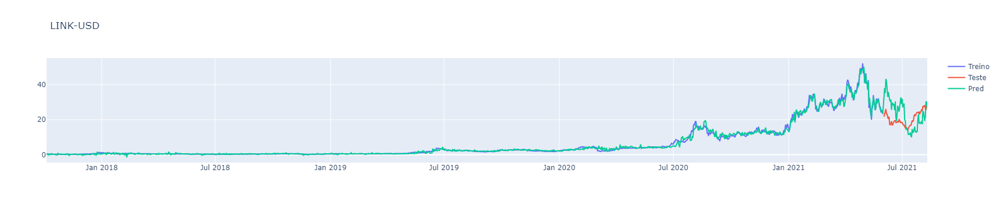


Feature importance para LINK-USD:


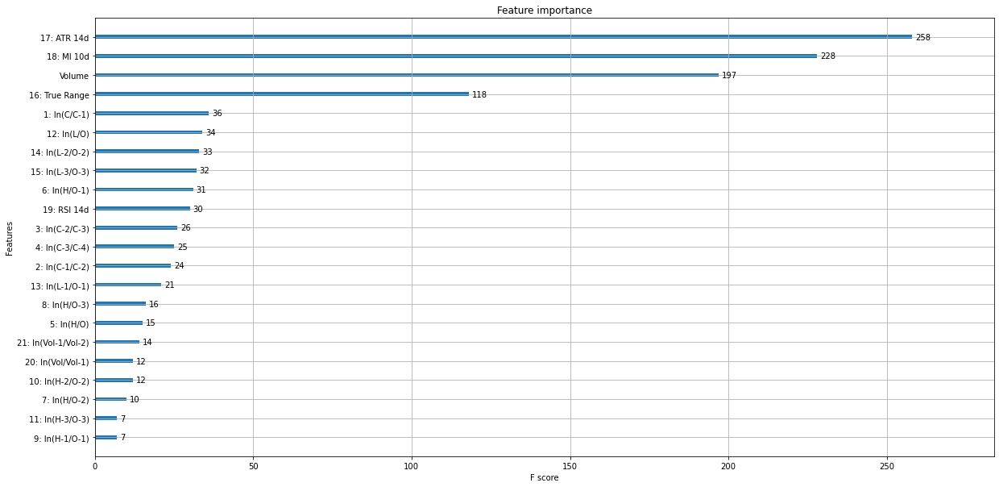


Resultados do modelo no teste para LINK-USD
MAPE = 0.3886
MSE = 8.9933
MAE = 7.8502
RMSE = 80.8792

Modelo_LINK-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para ADA-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1321
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


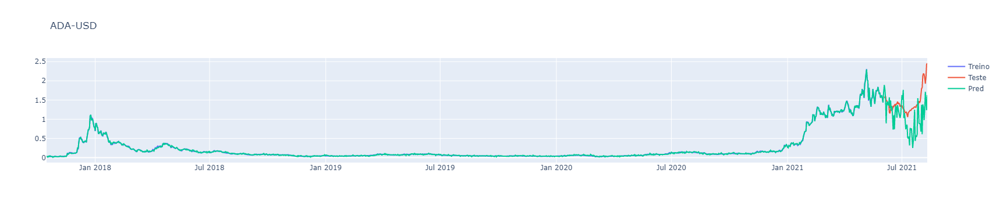


Feature importance para ADA-USD:


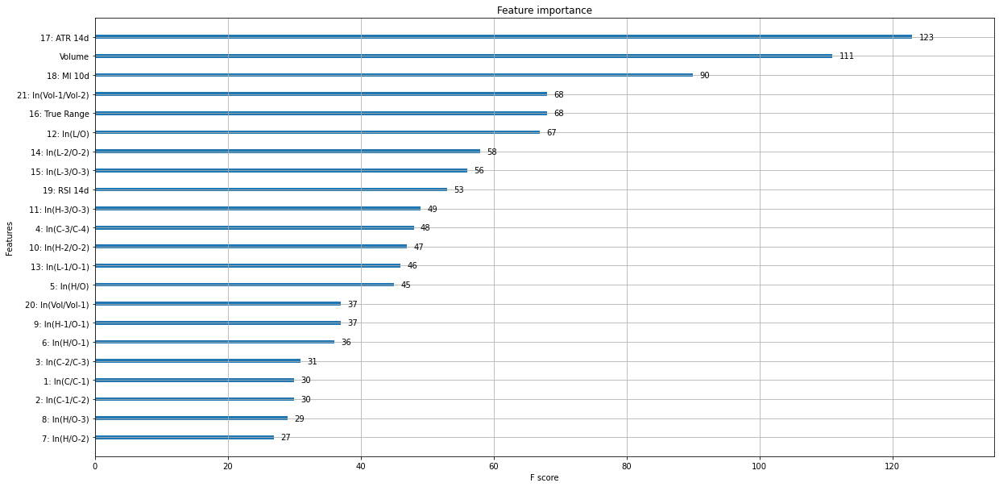


Resultados do modelo no teste para ADA-USD
MAPE = 0.3007
MSE = 0.5492
MAE = 0.4409
RMSE = 0.3017

Modelo_ADA-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para XTZ-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1321
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


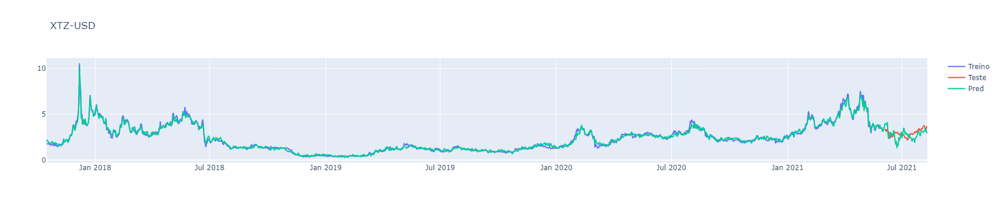


Feature importance para XTZ-USD:


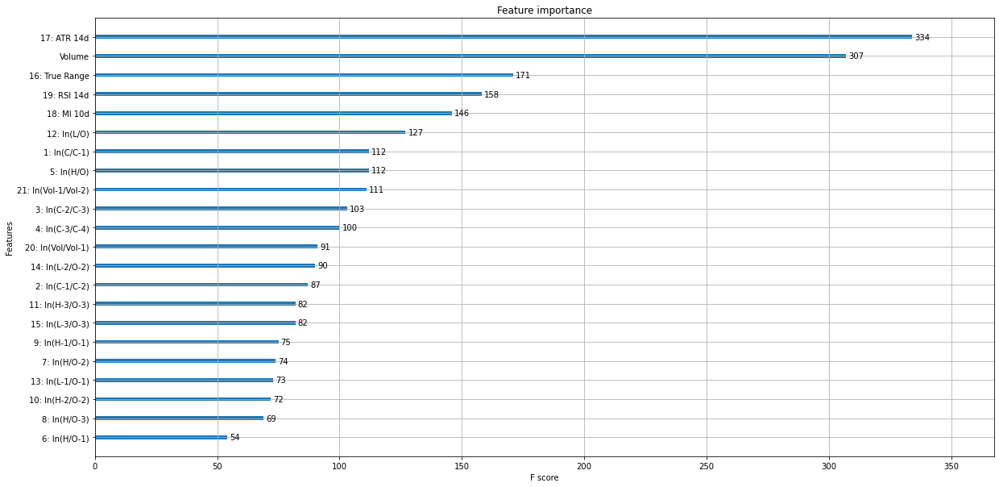


Resultados do modelo no teste para XTZ-USD
MAPE = 0.1762
MSE = 0.6147
MAE = 0.5207
RMSE = 0.3778

Modelo_XTZ-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para FIL-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1102
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


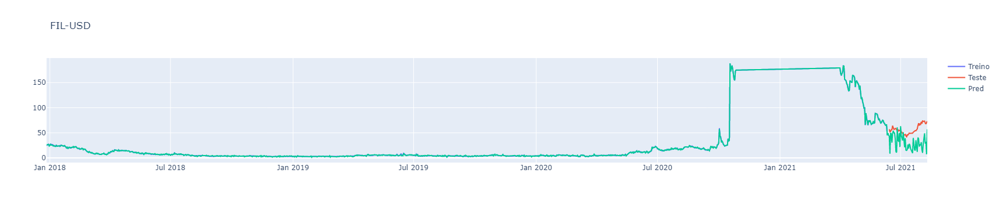


Feature importance para FIL-USD:


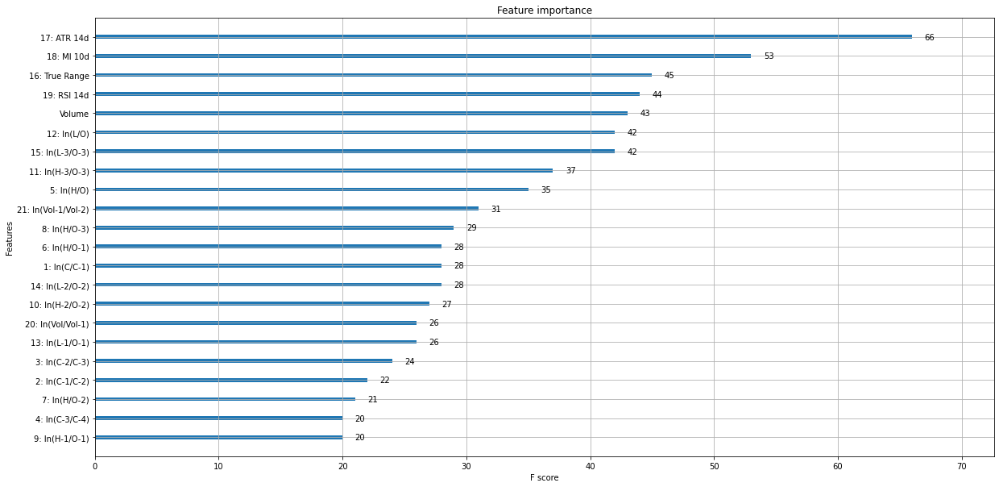


Resultados do modelo no teste para FIL-USD
MAPE = 0.4582
MSE = 30.4387
MAE = 26.4131
RMSE = 926.5149

Modelo_FIL-USD.joblib salvo com sucesso!

Iniciando tunning do modelo para THETA-USD
n_iterations: 5
n_required_iterations: 8
n_possible_iterations: 5
min_resources_: 8
max_resources_: 1216
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 3888
n_resources: 8
Fitting 4 folds for each of 3888 candidates, totalling 15552 fits
----------
iter: 1
n_candidates: 1296
n_resources: 24
Fitting 4 folds for each of 1296 candidates, totalling 5184 fits
----------
iter: 2
n_candidates: 432
n_resources: 72
Fitting 4 folds for each of 432 candidates, totalling 1728 fits
----------
iter: 3
n_candidates: 144
n_resources: 216
Fitting 4 folds for each of 144 candidates, totalling 576 fits
----------
iter: 4
n_candidates: 48
n_resources: 648
Fitting 4 folds for each of 48 candidates, totalling 192 fits

Melhor modelo escolhido com os parâmetros:


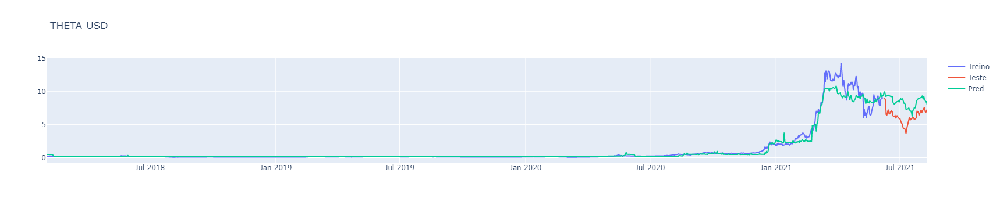


Feature importance para THETA-USD:


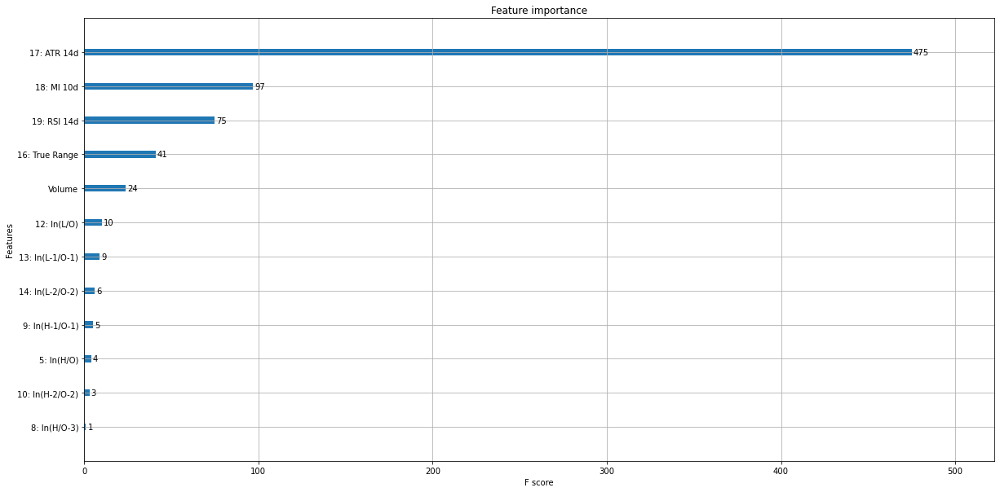


Resultados do modelo no teste para THETA-USD
MAPE = 0.3760
MSE = 2.3484
MAE = 2.1802
RMSE = 5.5149

Modelo_THETA-USD.joblib salvo com sucesso!


In [132]:
for crypto in ativos:
    model_crypto(crypto, df_ativos)